<a href="https://colab.research.google.com/github/YB-Sung/DXIC_Lab_12_DL3_Vanilla-RNN-LSTM-GRU-for-Time-series/blob/main/Vanilla_RNN_LSTM_GRU_for_Time_series_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [ LG전자 H&A DX Intensive Course - RNN/LSTM/GRU for Time-series ]

**Task**: time-series classifiation

In [ ]:
import os
import random
import json
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
from collections import defaultdict

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch import nn

import warnings
warnings.filterwarnings(action='ignore')

In [ ]:
def torch_seed(random_seed):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed) # if use multi-GPU
    # CUDA randomness
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    np.random.seed(random_seed)
    random.seed(random_seed)
    os.environ['PYTHONHASHSEED'] = str(random_seed)

# Dataset

## Download

데이터 출처: https://www.timeseriesclassification.com/description.php?Dataset=ECG200


<p align="center">
  <img src="https://www.timeseriesclassification.com/images/datasets/ECG.png" width="500">
</p>



In [ ]:
!wget https://www.timeseriesclassification.com/aeon-toolkit/ECG200.zip
!unzip ECG200.zip

--2024-03-20 12:45:04--  https://www.timeseriesclassification.com/aeon-toolkit/ECG200.zip
Resolving www.timeseriesclassification.com (www.timeseriesclassification.com)... 109.123.71.232
Connecting to www.timeseriesclassification.com (www.timeseriesclassification.com)|109.123.71.232|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 298857 (292K) [application/zip]
Saving to: ‘ECG200.zip’

ECG200.zip          100%[===================>] 291.85K   426KB/s    in 0.7s    

2024-03-20 12:45:06 (426 KB/s) - ‘ECG200.zip’ saved [298857/298857]

Archive:  ECG200.zip
  inflating: ECG200.txt              
  inflating: ECG200_TEST.arff        
  inflating: ECG200_TEST.txt         
  inflating: ECG200_TRAIN.arff       
  inflating: ECG200_TRAIN.txt        
  inflating: ECG200_TEST.ts          
  inflating: ECG200_TRAIN.ts         


## Load Datasets

데이터 구조
<p align="center">
  <img src="https://github.com/TooTouch/BalancedSoftmax/assets/37654013/731004bf-0107-4d1c-ab43-a8232b51a318">
</p>


In [ ]:
df_train = pd.read_csv('ECG200_TRAIN.txt', sep="  ", header=None)
df_test = pd.read_csv('ECG200_TEST.txt', sep="  ", header=None)

# split train dataset into train and validation dataset
df_train, df_valid = train_test_split(df_train, test_size=0.2, stratify=df_train.iloc[:,0], random_state=223)

df_train.head()

,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,92,93,94,95,96
9,1.0,1.668206,2.848173,2.516978,2.172773,0.720467,0.725376,1.638602,1.292904,1.609566,...,-0.154365,-0.017805,-0.007506,0.005362,-0.026597,-0.048192,-0.032347,-0.214054,0.056031,0.147889
33,1.0,0.188247,0.540119,2.178449,3.493769,2.075331,1.210254,-0.267326,-0.866860,0.283396,...,0.078554,0.059380,0.001421,0.041702,0.163330,-0.144984,-0.033069,0.220109,0.049481,0.129230
35,-1.0,2.041298,2.021590,1.925895,2.334360,1.173874,-0.452548,-0.728089,-0.972869,-1.133044,...,0.115283,0.066654,0.103960,0.238770,0.306208,0.337572,0.755266,0.867938,0.838234,1.358683
18,-1.0,1.088076,1.564040,1.368890,1.250157,1.491498,1.682589,1.226951,0.343969,-0.335317,...,0.244322,0.585254,0.547644,1.093302,2.150796,2.385066,1.993872,1.760286,1.269218,0.399103
28,1.0,0.466793,0.503625,0.788669,0.222936,0.537304,0.043553,-0.261141,0.803156,-0.139523,...,1.001974,0.674410,0.739324,0.540863,0.345834,0.777728,0.248128,0.004283,0.425194,0.117377


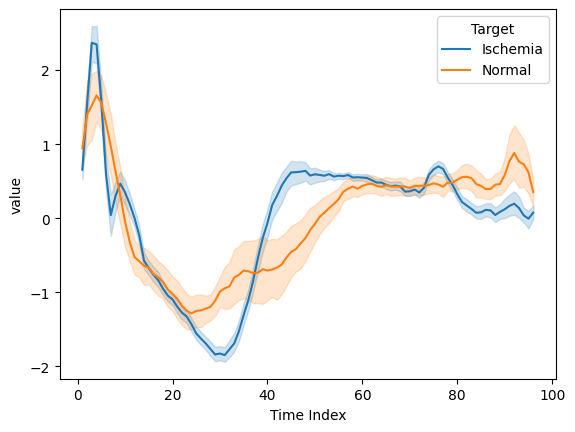

In [ ]:
temp = df_train.copy()
temp['Target'] = temp[0].map({1: "Ischemia", -1: "Normal"})
temp = temp.iloc[:,1:].set_index('Target').unstack().reset_index()
temp.columns = ['Time Index', 'Target', 'value']

sns.lineplot(data=temp, x='Time Index', y='value', hue='Target')
plt.show()

In [ ]:
print('trainset shape: ',df_train.shape)
print('trainset targets: ')
print(df_train.iloc[:,0].value_counts())
print()
print('validset shape: ',df_valid.shape)
print('validset targets: ')
print(df_valid.iloc[:,0].value_counts())
print()
print('testset shape: ',df_test.shape)
print('testset targets: ')
print(df_test.iloc[:,0].value_counts())
print()

trainset shape:  (80, 97)
trainset targets: 
 1.0    55
-1.0    25
Name: 0, dtype: int64

validset shape:  (20, 97)
validset targets: 
 1.0    14
-1.0     6
Name: 0, dtype: int64

testset shape:  (100, 97)
testset targets: 
 1.0    64
-1.0    36
Name: 0, dtype: int64



In [ ]:
x_train = np.expand_dims(df_train.values[:,1:], axis=-1)
y_train = ((df_train.values[:,0] + 1) / 2).astype(int)

x_valid = np.expand_dims(df_valid.values[:,1:], axis=-1)
y_valid = ((df_valid.values[:,0] + 1) / 2).astype(int)

x_test = np.expand_dims(df_test.values[:,1:], axis=-1)
y_test = ((df_test.values[:,0] + 1) / 2).astype(int)

## Create Dataset and DataLoader

In [ ]:
class TSDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __getitem__(self, i):
        return self.X[i].astype(np.float32), self.y[i]

    def __len__(self):
        return len(self.X)

In [ ]:
trainset = TSDataset(X=x_train, y=y_train)
validset = TSDataset(X=x_valid, y=y_valid)
testset = TSDataset(X=x_test, y=y_test)

In [ ]:
x_temp, y_temp = trainset[0]
print('x_temp.shape: ', x_temp.shape)
print('y_temp: ', y_temp)

x_temp.shape:  (96, 1)
y_temp:  1


In [ ]:
trainloader = DataLoader(
    dataset     = trainset,
    batch_size  = 32,
    shuffle     = True,
)

validloader = DataLoader(
    dataset     = validset,
    batch_size  = 32,
    shuffle     = False,
)

testloader = DataLoader(
    dataset     = testset,
    batch_size  = 32,
    shuffle     = False,
)

In [ ]:
inputs, targets = next(iter(trainloader))
print('inputs.shape: ', inputs.shape)
print('targets: ', targets)

inputs.shape:  torch.Size([32, 96, 1])
targets:  tensor([1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1])


# Build Model

Many-to-one 방법

<p align="center">
  <img src="https://github.com/TooTouch/BalancedSoftmax/assets/37654013/a0c3c511-c8fd-4ae3-b0e0-977063ec0624">
</p>

In [ ]:
class VanillaModel(nn.Module):
    def __init__(
        self,
        module_type: str,
        input_dim: int,
        hidden_dim: int,
        num_layers: int,
        num_classes: int,
        is_attention: bool = False
      ):
        super(VanillaModel, self).__init__()

        # check module type
        self.module_type = module_type
        module_list = ['RNN', 'LSTM', 'GRU']
        assert self.module_type in module_list, 'module_type is not in {}'.format(module_list)

        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        self.encoder = getattr(nn, module_type)(
            input_size  = input_dim,
            hidden_size = hidden_dim,
            num_layers  = num_layers,
            batch_first = True
          )

        self.clf = nn.Linear(in_features=hidden_dim, out_features=num_classes)

        # scale for attention
        self.is_attention = is_attention
        self.scale = 1. / math.sqrt(hidden_dim)
        if self.is_attention:
            self.linear = nn.Linear(in_features=hidden_dim * 2, out_features=hidden_dim)
            self.tanh = nn.Tanh()

    def attention(self, query, keys, values):
        '''
        Args:
        - query: batch size(B) x Q
        - keys: batch size(B) x time(T) x K
        - values: batch size(B) x time(T) x V

        Returns:
        - attn_score: batch size(B) x time(T)
        - out: batch size(B) x V
        '''

        query = query.unsqueeze(1) # [B x Q] -> [B x 1 x Q]
        keys = keys.transpose(1,2) # [B x T x K] -> [B x K x T]
        attn_weights = torch.bmm(query, keys) # [B x 1 x Q] x [B x K x T] -> [B x 1 x T]
        attn_weights = F.softmax(attn_weights.mul_(self.scale), dim=2) # scale, normalize

        outputs = torch.bmm(attn_weights, values).squeeze(1) #[B x 1 x T] x [B x T x V] -> [B x V]

        # projection
        outputs = self.linear(torch.cat([query.squeeze(1), outputs], dim=1))
        outputs = self.tanh(outputs)

        return attn_weights.squeeze(), outputs

    def forward(self, x, return_attn: bool = False):
        bs, _, _ = x.shape # (batch size x time length(sequence) x features)

        # Initialize hidden and cell states (num_layers x batch size x dim)
        h0 = torch.zeros(self.num_layers, bs, self.hidden_dim, device=x.device)

        if self.module_type == 'LSTM':
          c0 = torch.zeros(self.num_layers, bs, self.hidden_dim, device=x.device)
          states = (h0, c0)
        elif self.module_type in ['RNN', 'GRU']:
          states = h0

        # encoding
        out, states = self.encoder(x, states)

        # last output
        out_last = out[:, -1, :]

        # attention
        if self.is_attention:
            attn_weights, out_last = self.attention(query=out_last, keys=out, values=out)

        # Decode the hidden state of the last time step
        out = self.clf(out_last)

        if return_attn:
            return out, attn_weights
        else:
            return out

In [ ]:
# Instantiate the RNN model
model_rnn = VanillaModel(module_type='RNN', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2)
model_rnn

VanillaModel(
  (encoder): RNN(1, 32, num_layers=2, batch_first=True)
  (clf): Linear(in_features=32, out_features=2, bias=True)
)

In [ ]:
outputs = model_rnn(inputs)
outputs.shape

torch.Size([32, 2])

# Model Training

In [ ]:
def train(model, trainloader, optimizer, criterion):
    # train mode
    model.train()

    # device
    device = next(iter(model.parameters())).device

    # results
    correct = 0
    total = 0
    total_loss = 0

    # progress
    pbar = tqdm(trainloader, total=len(trainloader), desc="[TRAIN]", leave=False)

    # training
    for batch_i, batch in enumerate(pbar):
        inputs, targets = batch

        # device
        inputs, targets = inputs.to(device), targets.to(device)

        # outputs
        outputs = model(inputs)

        # loss
        loss = criterion(outputs, targets)
        total_loss += loss.item()

        # compute gradients
        loss.backward()

        # update model parameters using optimizer
        optimizer.step()
        optimizer.zero_grad()

        # accuracy
        preds_values, preds_cls = outputs.max(dim=1)
        correct_i = targets.eq(preds_cls).sum().item()
        len_i = inputs.size(0)

        correct += correct_i
        total += len_i

        acc = correct_i / len_i

        # update progress
        pbar.set_description(desc="[TRAIN]: Loss: {loss:7.4f} ({loss_avg:7.4f}) ACC: {acc:.2%} ({acc_avg:.2%}) [{correct:}/{total:}]".format(
            loss     = loss,
            loss_avg = total_loss / (batch_i+1),
            acc      = acc,
            acc_avg  = correct/total,
            correct  = correct,
            total    = total
        ))

    return {
        'loss' : total_loss / len(trainloader),
        'acc'  : correct / total
    }

def test(model, testloader, criterion):
    # evaluation mode
    model.eval()

    # device
    device = next(iter(model.parameters())).device

    # results
    correct = 0
    total = 0
    total_loss = 0

    # progress
    pbar = tqdm(testloader, total=len(testloader), desc="[TEST]", leave=False)

    # evaluation
    with torch.no_grad():
        for batch_i, batch in enumerate(pbar):
            inputs, targets = batch

            # device
            inputs, targets = inputs.to(device), targets.to(device)

            # outputs
            outputs = model(inputs)

            # loss
            loss = criterion(outputs, targets)
            total_loss += loss.item()

            # accuracy
            preds_values, preds_cls = outputs.max(dim=1)
            correct_i = targets.eq(preds_cls).sum().item()
            len_i = inputs.size(0)

            correct += correct_i
            total += len_i

            acc = correct_i / len_i

            # update progress
            pbar.set_description(desc="[TEST]: Loss: {loss:7.4f} ({loss_avg:7.4f}) ACC: {acc:.2%} ({acc_avg:.2%}) [{correct:}/{total:}]".format(
                loss     = loss,
                loss_avg = total_loss / (batch_i+1),
                acc      = acc,
                acc_avg  = correct/total,
                correct  = correct,
                total    = total
            ))

    return {
        'loss' : total_loss / len(testloader),
        'acc'  : correct / total
    }

def fit(model, epochs, trainloader, testloader, criterion, optimizer, scheduler, savedir: str, seed: int = 223):
    torch_seed(seed)

    # make save directory
    os.makedirs(savedir, exist_ok=True)

    # history
    history = {'train': defaultdict(list), 'test': defaultdict(list)}
    best_acc = 0

    # progress bar
    pbar = tqdm(range(epochs), total=epochs)
    for i in pbar:

        # train
        train_results = train(
            model       = model,
            trainloader = trainloader,
            criterion   = criterion,
            optimizer   = optimizer
        )

        # test
        test_results = test(
            model      = model,
            testloader = testloader,
            criterion  = criterion
        )

        # update scheduler
        scheduler.step()

        # update progress
        pbar.set_description(desc="[TRAIN] Loss: {loss_train:>7.4f} Acc: {acc_train:.2%} [TEST] Loss: {loss_test:>7.4f} Acc: {acc_test:.2%}".format(
            loss_train = train_results['loss'],
            acc_train  = train_results['acc'],
            loss_test  = test_results['loss'],
            acc_test   = test_results['acc']
        ))

        # append history
        for k, v in train_results.items():
            history['train'][k].append(v)

        for k, v in test_results.items():
            history['test'][k].append(v)

        # save best model
        if best_acc < test_results['acc']:
            torch.save(model.state_dict(), os.path.join(savedir, 'best_model.pt'))

    # save results
    json.dump(history, open(os.path.join(savedir, 'history.json'), 'w'), indent='\t')

    return history

def history_plot(history: dict):
    # train history table
    df_train_history = pd.DataFrame(history['train'])
    df_train_history['epoch'] = range(len(df_train_history))
    df_train_history['split'] = 'train'

    # test history table
    df_test_history = pd.DataFrame(history['test'])
    df_test_history['epoch'] = range(len(df_test_history))
    df_test_history['split'] = 'test'
    df_history = pd.concat([df_train_history, df_test_history], axis=0)

    # plot
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    for i, m in enumerate(['acc', 'loss']):
        sns.lineplot(
            x    = 'epoch',
            y    = m,
            hue  = 'split',
            data = df_history,
            ax   = ax[i]
        )
        ax[i].set_ylabel(m.upper())
    plt.tight_layout()
    plt.show()

In [ ]:
epochs = 100
lr = 1e-3
eta_min = lr * 1e-2
seed = 223

In [ ]:
# Instantiate the RNN model
torch_seed(223)
model_rnn = VanillaModel(module_type='RNN', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2)
model_lstm = VanillaModel(module_type='LSTM', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2)
model_gru = VanillaModel(module_type='GRU', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2)

print('RNN parameters: {:,}'.format(sum([p.numel() for p in model_rnn.parameters()])))
print('LSTM parameters: {:,}'.format(sum([p.numel() for p in model_lstm.parameters()])))
print('GRU parameters: {:,}'.format(sum([p.numel() for p in model_gru.parameters()])))

model_rnn.cuda()
model_lstm.cuda()
model_gru.cuda()
print('convert device to GPU')

RNN parameters: 3,298
LSTM parameters: 12,994
GRU parameters: 9,762
convert device to GPU


In [ ]:
# optimizer
optimizer_rnn = torch.optim.Adam(model_rnn.parameters(), lr=lr)
optimizer_lstm = torch.optim.Adam(model_lstm.parameters(), lr=lr)
optimizer_gru = torch.optim.Adam(model_gru.parameters(), lr=lr)

scheduler_rnn = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_rnn, T_max=epochs, eta_min=eta_min)
scheduler_lstm = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_lstm, T_max=epochs, eta_min=eta_min)
scheduler_gru = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_gru, T_max=epochs, eta_min=eta_min)

# loss function
criterion = nn.CrossEntropyLoss()

RNN


  0%|          | 0/100 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

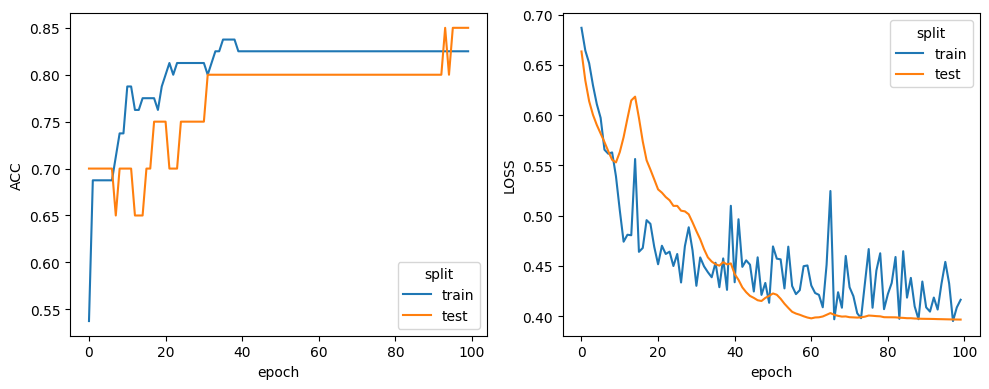

LSTM


  0%|          | 0/100 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

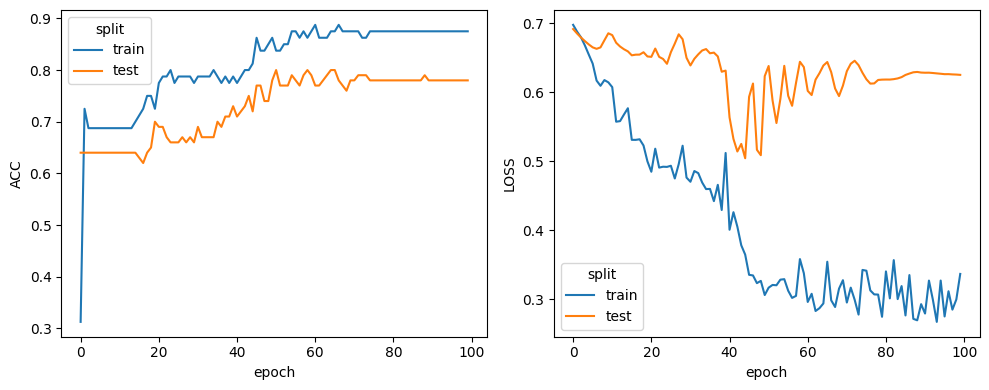

GRU


  0%|          | 0/100 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

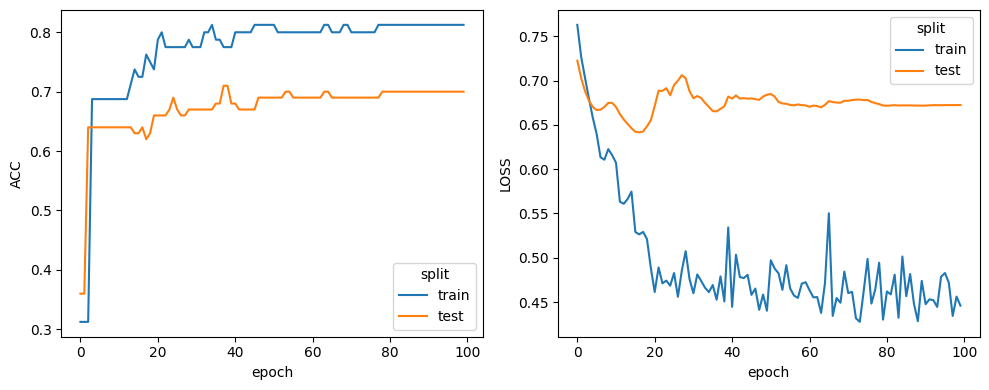

In [ ]:
print('RNN')
rnn_history = fit(
    model       = model_rnn,
    epochs      = epochs,
    trainloader = trainloader,
    testloader  = validloader,
    criterion   = criterion,
    optimizer   = optimizer_rnn,
    scheduler   = scheduler_rnn,
    savedir     = 'saved_model/RNN',
    seed        = seed
)
history_plot(history=rnn_history)

print('LSTM')
lstm_history = fit(
    model       = model_lstm,
    epochs      = epochs,
    trainloader = trainloader,
    testloader  = testloader,
    criterion   = criterion,
    optimizer   = optimizer_lstm,
    scheduler   = scheduler_lstm,
    savedir     = 'saved_model/LSTM',
    seed        = seed
)
history_plot(history=lstm_history)

print('GRU')
gru_history = fit(
    model       = model_gru,
    epochs      = epochs,
    trainloader = trainloader,
    testloader  = testloader,
    criterion   = criterion,
    optimizer   = optimizer_gru,
    scheduler   = scheduler_gru,
    savedir     = 'saved_model/GRU',
    seed        = seed
)
history_plot(history=gru_history)


# Test

In [ ]:
model_rnn.load_state_dict(torch.load('./saved_model/RNN/best_model.pt'))
model_lstm.load_state_dict(torch.load('./saved_model/LSTM/best_model.pt'))
model_gru.load_state_dict(torch.load('./saved_model/GRU/best_model.pt'))

<All keys matched successfully>

In [ ]:
# test
rnn_test_results = test(
    model      = model_rnn,
    testloader = testloader,
    criterion  = criterion
)
print('RNN Accuracy: {:.2%}'.format(rnn_test_results['acc']))

# test
lstm_test_results = test(
    model      = model_lstm,
    testloader = testloader,
    criterion  = criterion
)
print('LSTM Accuracy: {:.2%}'.format(lstm_test_results['acc']))

# test
gru_test_results = test(
    model      = model_gru,
    testloader = testloader,
    criterion  = criterion
)
print('GRU Accuracy: {:.2%}'.format(gru_test_results['acc']))

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

RNN Accuracy: 71.00%


[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

LSTM Accuracy: 78.00%


[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

GRU Accuracy: 70.00%


# RNN Attention

<p align="center">
  <img src="https://github.com/TooTouch/BalancedSoftmax/assets/37654013/f6f6949f-bc1e-490e-95a2-8ccedd09837d">
</p>


```python
class VanillaModel(nn.Module):
    def __init__(self, ...):
        super(VanillaModel, self).__init__()
        ...

        # scale for attention
        self.is_attention = is_attention
        self.scale = 1. / math.sqrt(hidden_dim)
        if self.is_attention:
            self.linear = nn.Linear(in_features=hidden_dim * 2, out_features=hidden_dim)
            self.tanh = nn.Tanh()

    def attention(self, query, keys, values):
        '''
        Args:
        - query: batch size(B) x Q
        - keys: batch size(B) x time(T) x K
        - values: batch size(B) x time(T) x V

        Returns:
        - attn_score: batch size(B) x time(T)
        - out: batch size(B) x V
        '''

        query = query.unsqueeze(1) # [B x Q] -> [B x 1 x Q]
        keys = keys.transpose(1,2) # [B x T x K] -> [B x K x T]
        attn_weights = torch.bmm(query, keys) # [B x 1 x Q] x [B x K x T] -> [B x 1 x T]
        attn_weights = F.softmax(attn_weights.mul_(self.scale), dim=2) # scale, normalize

        outputs = torch.bmm(attn_weights, values).squeeze(1) #[B x 1 x T] x [B x T x V] -> [B x V]

        # projection
        outputs = self.linear(torch.cat([query.squeeze(1), outputs], dim=1))
        outputs = self.tanh(outputs)

        return attn_weights.squeeze(), outputs

    def forward(self, x, return_attn: bool = False):
        ...
```

In [ ]:
time_length = 8

inputs = torch.randn(1, time_length, 1)
model_rnn_attn = VanillaModel(module_type='RNN', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2, is_attention=True)
outputs, attn_weights = model_rnn_attn(inputs, return_attn=True)

print('outputs.shape: ',outputs.shape)
print('attn_weights.shape: ',attn_weights.shape)
print('attn_weights: ',attn_weights.detach().numpy())
print('attn_weights.sum(): ',attn_weights.sum().item())

outputs.shape:  torch.Size([1, 2])
attn_weights.shape:  torch.Size([8])
attn_weights:  [0.12484445 0.12360543 0.12522215 0.12773022 0.12495481 0.12344772
 0.12209803 0.12809722]
attn_weights.sum():  1.0


## RNN Attention Model Training

In [ ]:
epochs = 100
lr = 1e-3
eta_min = lr * 1e-2
seed = 223

RNN parameters: 5,378
convert device to GPU
RNN Attention


  0%|          | 0/100 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

[TRAIN]:   0%|          | 0/3 [00:00<?, ?it/s]

[TEST]:   0%|          | 0/1 [00:00<?, ?it/s]

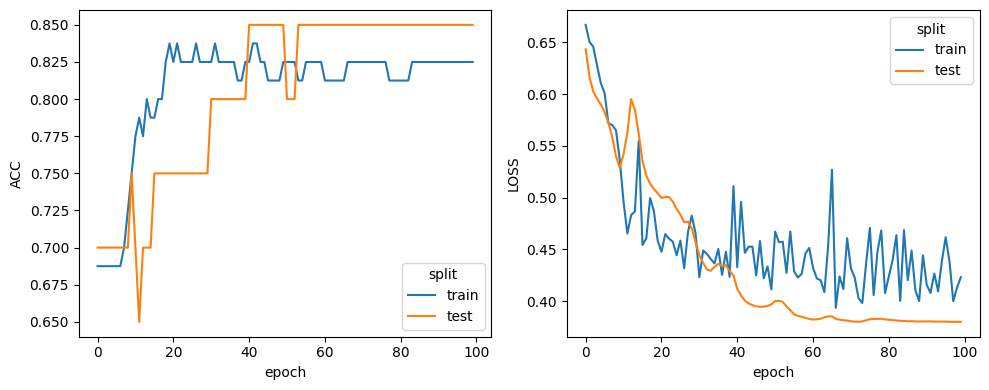

In [ ]:
# Instantiate the RNN model
torch_seed(223)
model_rnn = VanillaModel(module_type='RNN', input_dim=1, hidden_dim=32, num_layers=2, num_classes=2, is_attention=True)

print('RNN parameters: {:,}'.format(sum([p.numel() for p in model_rnn.parameters()])))

model_rnn.cuda()
print('convert device to GPU')

# optimizer
optimizer_rnn = torch.optim.Adam(model_rnn.parameters(), lr=lr)

# scheduler
scheduler_rnn = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_rnn, T_max=epochs, eta_min=eta_min)

# loss function
criterion = nn.CrossEntropyLoss()

print('RNN Attention')
rnn_history = fit(
    model       = model_rnn,
    epochs      = epochs,
    trainloader = trainloader,
    testloader  = validloader,
    criterion   = criterion,
    optimizer   = optimizer_rnn,
    scheduler   = scheduler_rnn,
    savedir     = 'saved_model/RNN-Attention',
    seed        = seed
)
history_plot(history=rnn_history)

In [ ]:
model_rnn.load_state_dict(torch.load('./saved_model/RNN-Attention/best_model.pt'))

# test
rnn_test_results = test(
    model      = model_rnn,
    testloader = testloader,
    criterion  = criterion
)
print('RNN Accuracy: {:.2%}'.format(rnn_test_results['acc']))

[TEST]:   0%|          | 0/4 [00:00<?, ?it/s]

RNN Accuracy: 71.00%


## RNN Attention Analysis

In [ ]:
def minmax(x):
    return (x - x.min()) / (x.max() - x.min())

def plot_with_attention(x: np.ndarray, target: int, attn_weights: np.ndarray):
    target_map = {0:'Normal', 1:'Ischemia'}

    # description
    desc_target = '[Target] {}'.format(target_map[target_idx])
    desc_preds = '[Probability] Normal: {:.2%} Ischemia: {:.2%}'.format(*F.softmax(outputs[idx]))
    desc = desc_target + '\n' + desc_preds

    # figure
    fig, ax = plt.subplots(1, 1, figsize=(15, 4))
    sns.lineplot(x.squeeze().cpu().numpy(), marker='o', ax=ax)
    ax.set_ylim([-4,4])
    ax.set_title(desc)
    for i, v in enumerate(attn_values):
        ax.axvspan(i-0.5, i+0.5, facecolor='red', alpha=v.item())
    plt.tight_layout()
    plt.show()

In [ ]:
with torch.no_grad():
    inputs, targets = next(iter(testloader))
    inputs, targets = inputs.cuda(), targets.cuda()
    outputs, attn_weights = model_rnn(inputs, return_attn=True)

correct = targets.eq(outputs.argmax(dim=1)).cpu().numpy()
correct_idx = np.where(correct == True)[0]

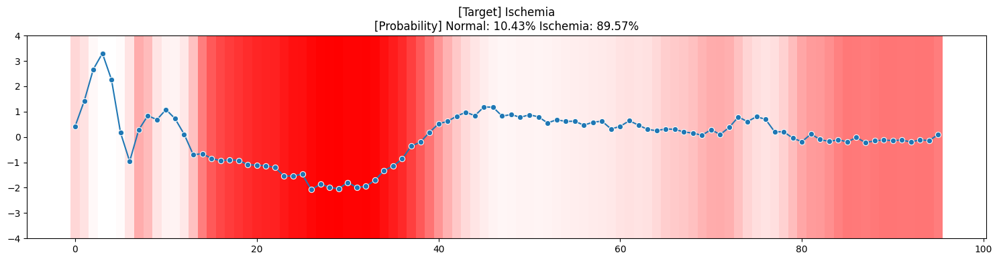

In [ ]:
# select index
idx = correct_idx[0]
target_idx = targets[idx].item()
attn_values = minmax(attn_weights[idx])

plot_with_attention(x=inputs[idx], target=target_idx, attn_weights=attn_values)

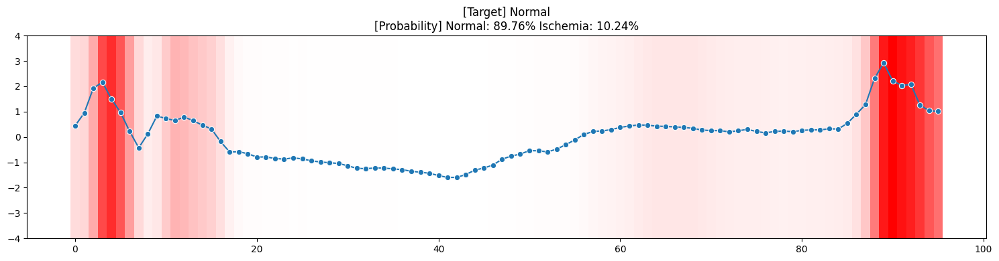

In [ ]:
# select index
idx = correct_idx[3]
target_idx = targets[idx].item()
attn_values = minmax(attn_weights[idx])

plot_with_attention(x=inputs[idx], target=target_idx, attn_weights=attn_values)